# Data Exploration

## Import libraries

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
%matplotlib inline  

## Load data

### Wind power data

In [2]:
df_power = []
for i in range(1,11):
    df_power_zone = pd.read_csv('../data/Task 15/Task15_W_Zone1_10/Task15_W_Zone'+str(i)+'.csv', 
                                header=0, 
                                usecols=[1, 2], 
                                names=['datetime', 'wf'+str(i)])
    df_power_zone['datetime'] = pd.to_datetime(df_power_zone['datetime'], format='%Y%m%d %H:%M')
    df_power_zone.index = df_power_zone['datetime']
    df_power_zone = df_power_zone.drop(['datetime'], axis=1)
    df_power.append(df_power_zone)
df_power = pd.concat(df_power, axis=1, join='outer')

Check datetime range. 

In [3]:
print(df_power.index[0])
print(df_power.index[-1])
df_power.head()

2012-01-01 01:00:00
2013-12-01 00:00:00


,wf1,wf2,wf3,wf4,wf5,wf6,wf7,wf8,wf9,wf10
datetime,,,,,,,,,,
2012-01-01 01:00:00,0.000000,0.596273,0.425465,0.378229,0.273678,0.268101,0.000000,0.000000,0.0,0.594361
2012-01-01 02:00:00,0.054879,0.411180,0.363851,0.063012,0.086796,0.034542,0.014708,0.014954,0.0,0.569679
2012-01-01 03:00:00,0.110234,0.167243,0.297129,0.036704,0.006811,0.020621,0.035098,0.071785,0.0,0.330539
2012-01-01 04:00:00,0.165116,0.037326,0.235438,0.034342,0.018646,0.001867,0.045055,0.066796,0.0,0.211308
2012-01-01 05:00:00,0.156940,0.051206,0.120904,0.033554,0.034812,0.015174,0.050160,0.034797,0.0,0.172140


### Clean data

Check how many NaNs for each time series. 

In [4]:
df_power.isnull().sum()

wf1     11
wf2     13
wf3     88
wf4      0
wf5      0
wf6      0
wf7      0
wf8      0
wf9      0
wf10     0
dtype: int64

In [5]:
df_power = df_power.fillna(method='ffill')

In [6]:
df_power.isnull().sum()

wf1     0
wf2     0
wf3     0
wf4     0
wf5     0
wf6     0
wf7     0
wf8     0
wf9     0
wf10    0
dtype: int64

Check if there are any duplicated datetimes. 

In [7]:
df_power.index.duplicated().sum()

0

Check if there are any missing datetimes. 

In [8]:
df_ideal = pd.DatetimeIndex(start=df_power.index[0], end=df_power.index[-1], freq='1H')
missing = df_ideal.shape[0]-df_power.shape[0]
missing

0

### Meteorological data

In [9]:
df_wind = []
for i in range(1,11):
    df_wind_zone = pd.read_csv('../data/Task 15/Task15_W_Zone1_10/Task15_W_Zone'+str(i)+'.csv', 
                          header=0, 
                          usecols=[1, 3, 4, 5, 6],
                          names=['datetime', 'U10', 'V10', 'U100', 'V100'])
    df_wind_zone['datetime'] = pd.to_datetime(df_wind_zone['datetime'], format='%Y%m%d %H:%M')
    df_wind_zone.index = df_wind_zone['datetime']
    df_wind_zone = df_wind_zone.drop(['datetime'], axis=1)
    df_wind.append(df_wind_zone)
df_wind = pd.concat(df_wind, axis=1, keys=[str(i) for i in range(1,11)])

Check datetime range. 

In [10]:
print(df_wind.index[0])
print(df_wind.index[-1])
df_wind['1'].head()

2012-01-01 01:00:00
2013-12-01 00:00:00


,U10,V10,U100,V100
datetime,,,,
2012-01-01 01:00:00,2.124600,-2.681966,2.864280,-3.666076
2012-01-01 02:00:00,2.521695,-1.796960,3.344859,-2.464761
2012-01-01 03:00:00,2.672210,-0.822516,3.508448,-1.214093
2012-01-01 04:00:00,2.457504,-0.143642,3.215233,-0.355546
2012-01-01 05:00:00,2.245898,0.389576,2.957678,0.332701


### Clean data

Check how many NaNs for each time series.

In [11]:
df_wind.isnull().sum()

1   U10     0
    V10     0
    U100    0
    V100    0
2   U10     0
    V10     0
    U100    0
    V100    0
3   U10     0
    V10     0
    U100    0
    V100    0
4   U10     0
    V10     0
    U100    0
    V100    0
5   U10     0
    V10     0
    U100    0
    V100    0
6   U10     0
    V10     0
    U100    0
    V100    0
7   U10     0
    V10     0
    U100    0
    V100    0
8   U10     0
    V10     0
    U100    0
    V100    0
9   U10     0
    V10     0
    U100    0
    V100    0
10  U10     0
    V10     0
    U100    0
    V100    0
dtype: int64

Check if there are any duplicated datetimes.

In [12]:
df_wind.index.duplicated().sum()

0

Check if there are any missing datetimes.

In [13]:
df_ideal = pd.DatetimeIndex(start=df_wind.index[0], end=df_wind.index[-1], freq='1H')
missing = df_ideal.shape[0]-df_wind.shape[0]
missing

0

## Wind power time series

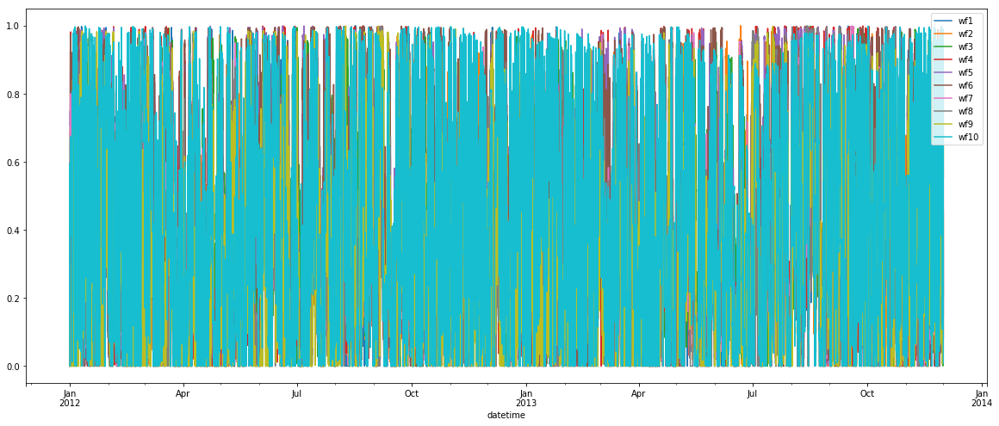

In [14]:
df_power.plot(figsize=(20,8));

## Wind power distribution

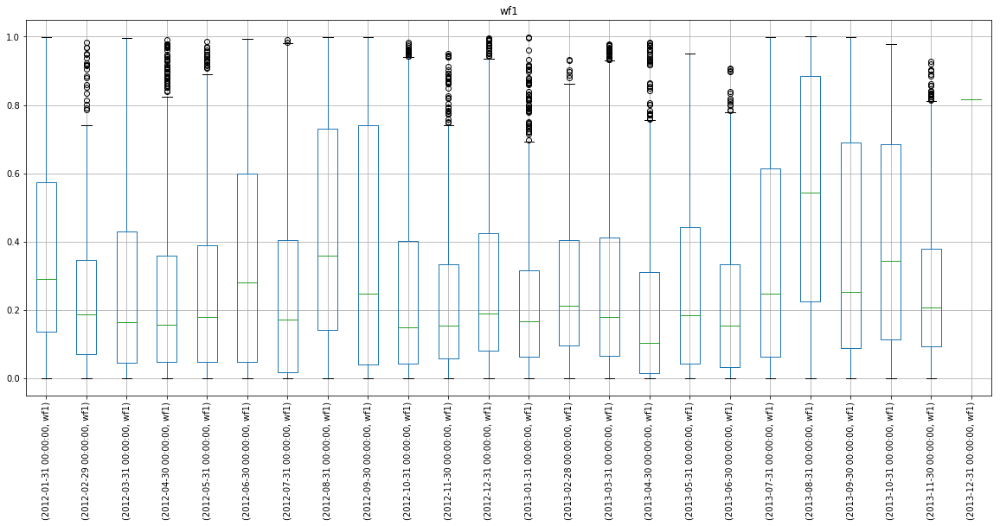

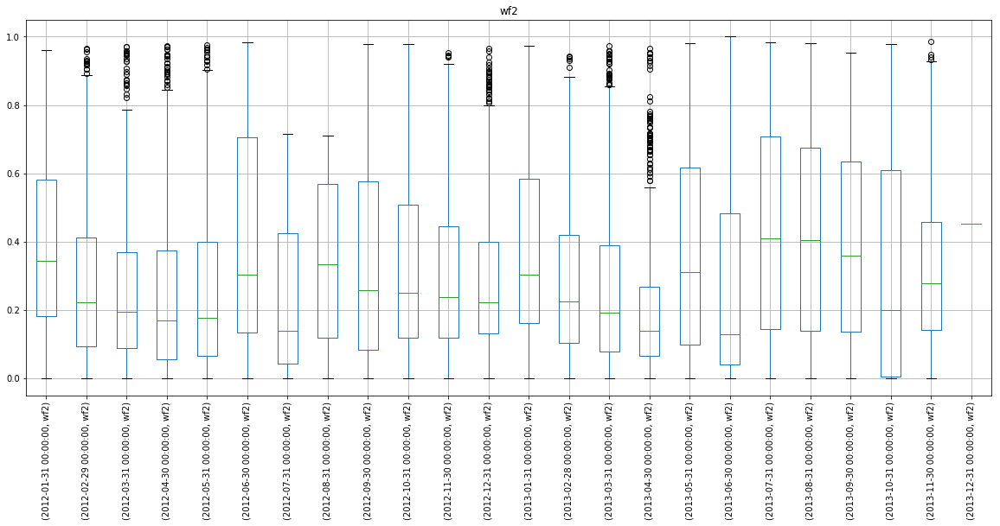

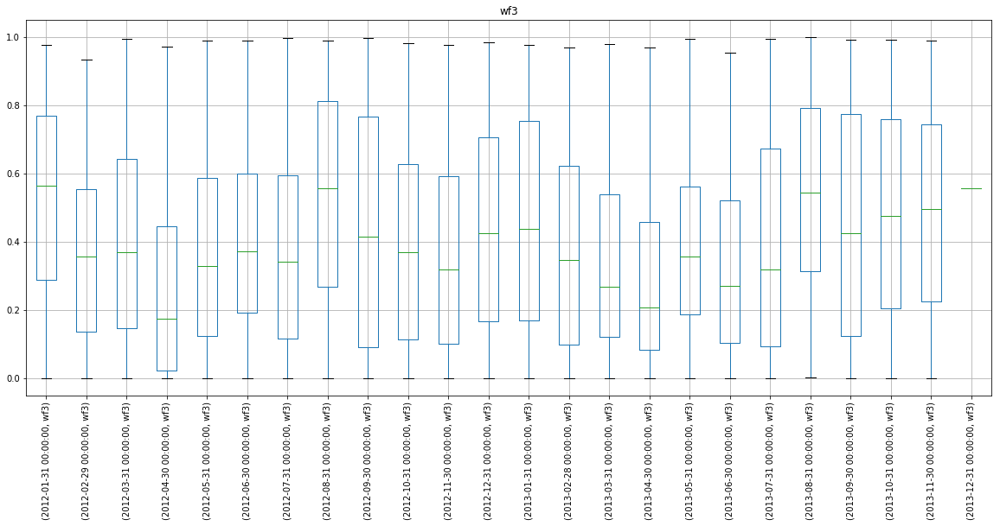

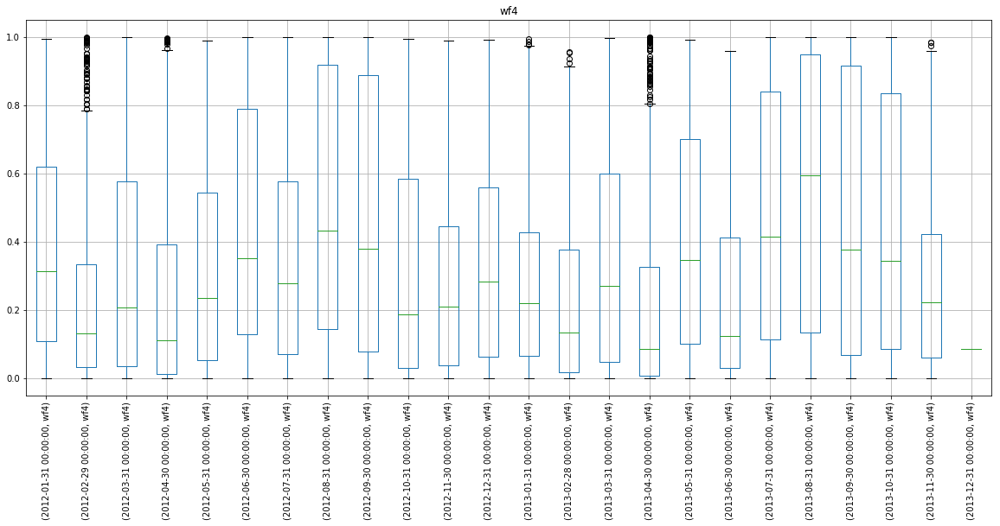

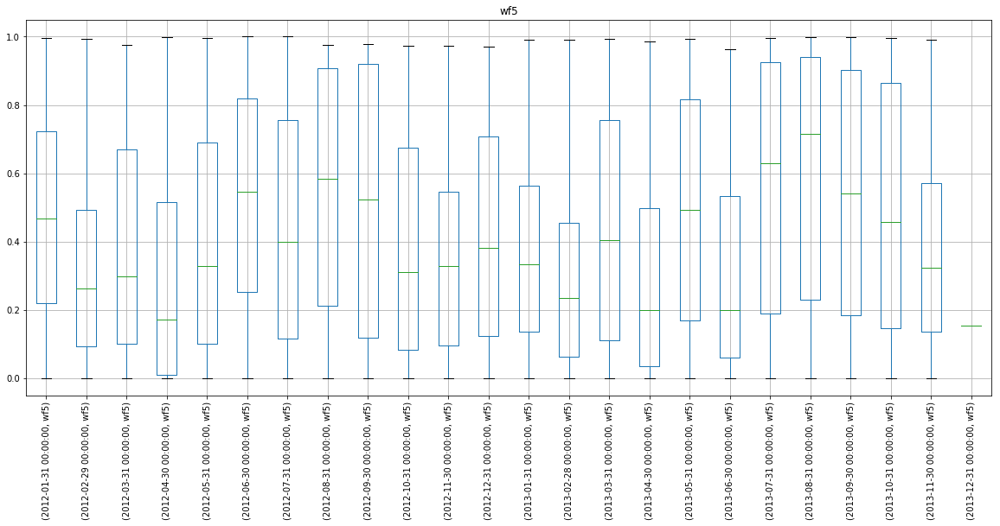

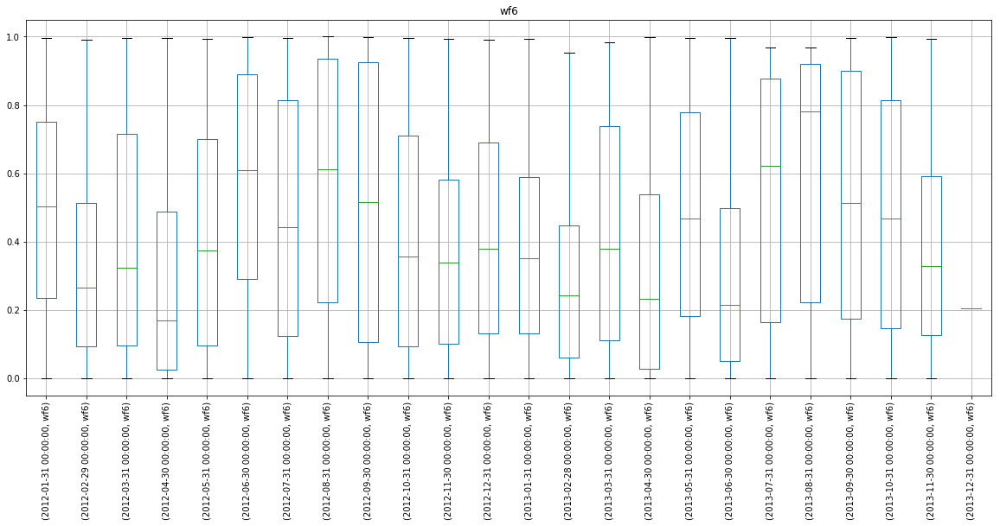

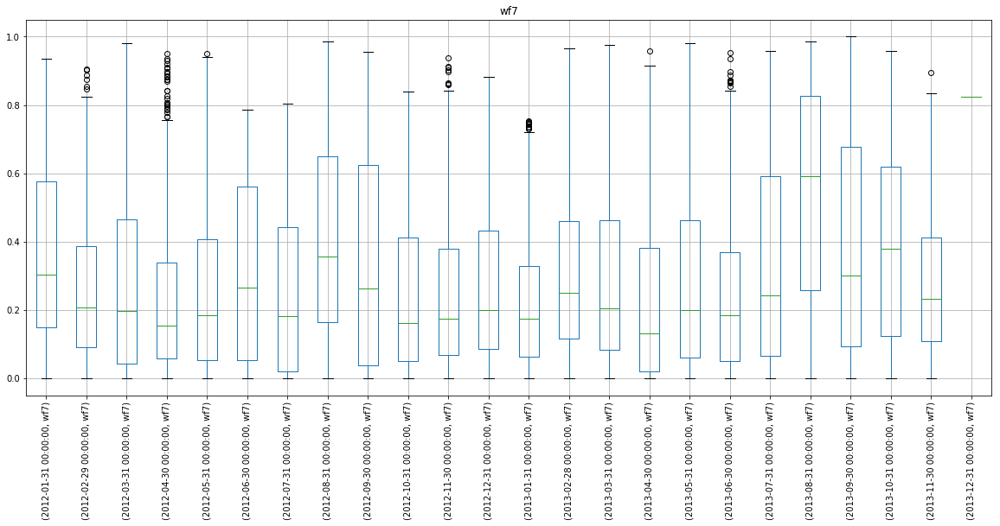

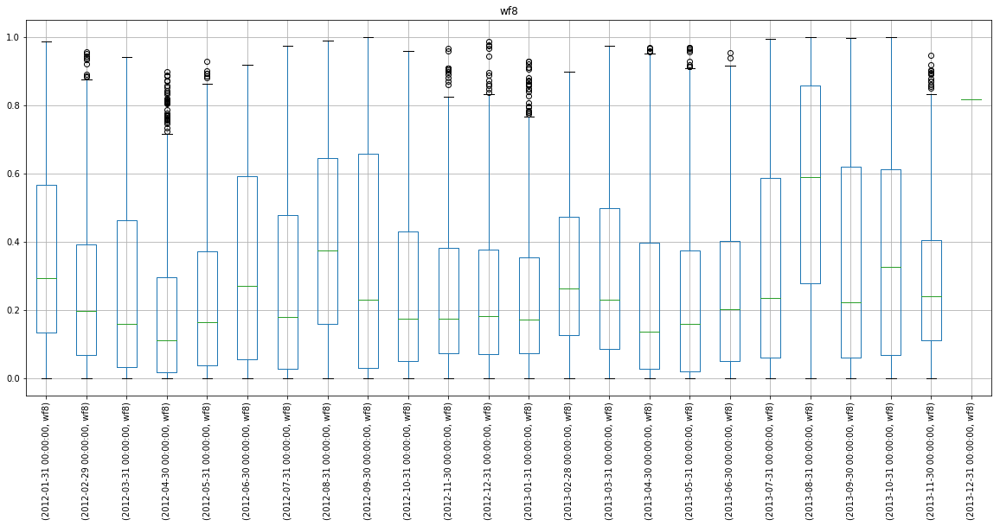

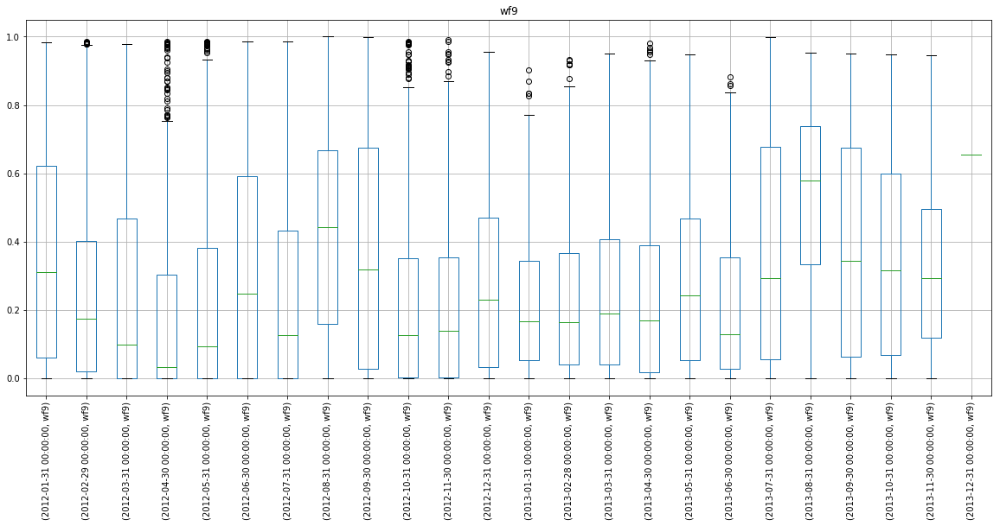

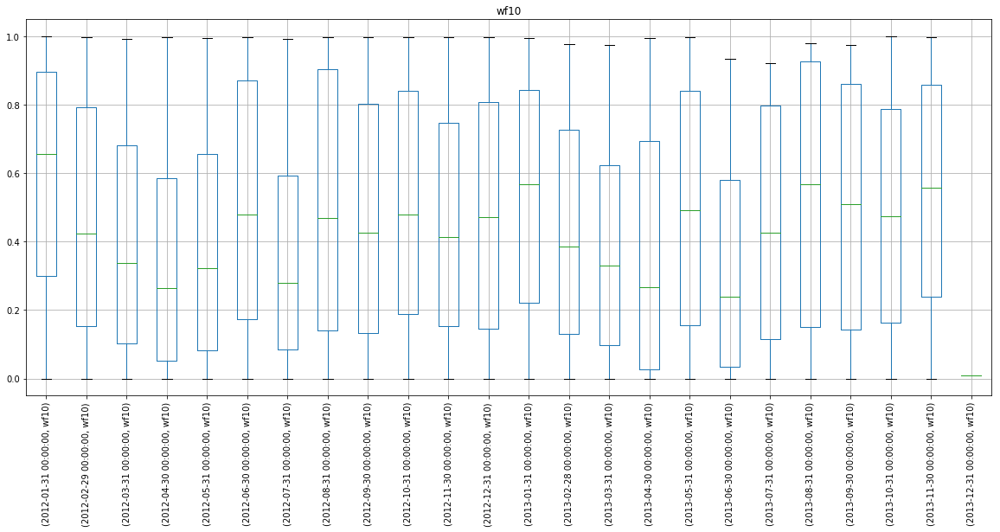

In [16]:
for column in df_power.columns: 
    plt.figure(figsize=(20,8))
    df_power[[column]].groupby(pd.Grouper(freq='M')).boxplot(subplots=False, rot=90)
    plt.title(column)

## Wind power correlation

In [18]:
def lag_scatter(df, lags):
    lags = 11
    columns = [df]
    for i in range(1,(lags + 1)):
        columns.append(df.shift(i))
    dataframe = pd.concat(columns, axis=1)
    columns = ['t-0']

    for i in range(1,(lags + 1)):
        columns.append('t-' + str(i))
    dataframe.columns = columns

    plt.figure(figsize=(16, 12), facecolor='white')
    for i in range(0,(lags + 1)):
        ax = plt.subplot(3,4,i+1)
        ax.set_title('t vs t-' + str(i))
        plt.scatter(x=dataframe['t-0'].values, y=dataframe['t-'+str(i)].values, s=2)
    plt.show()

wf1


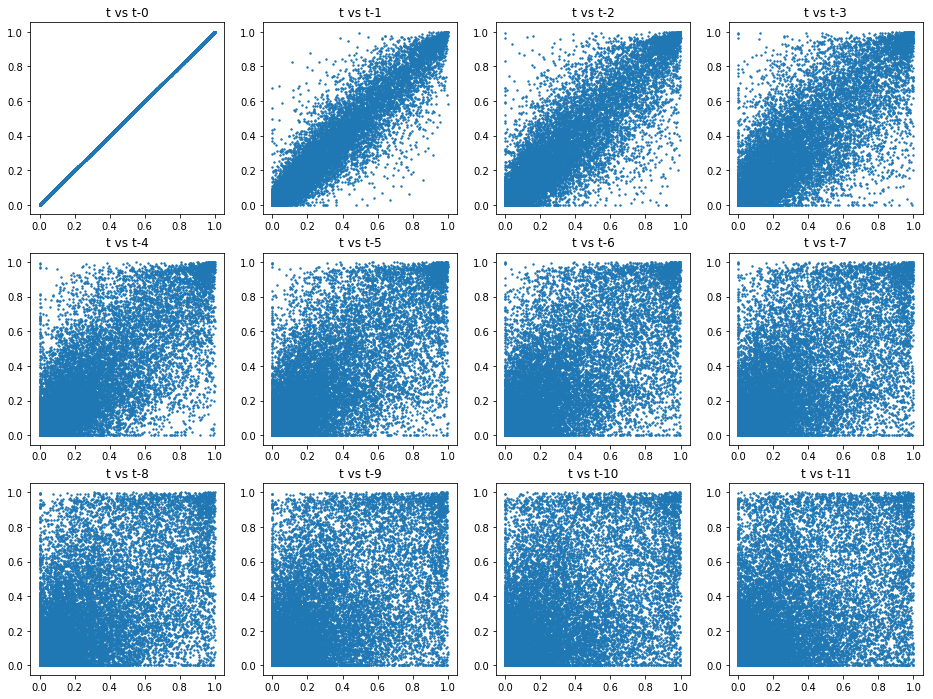

wf2


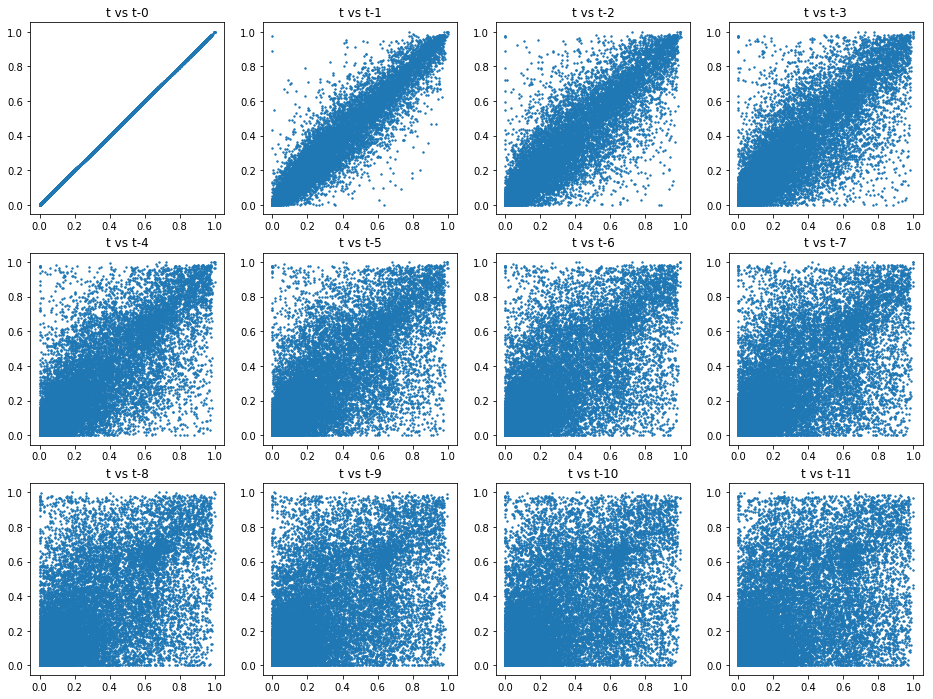

wf3


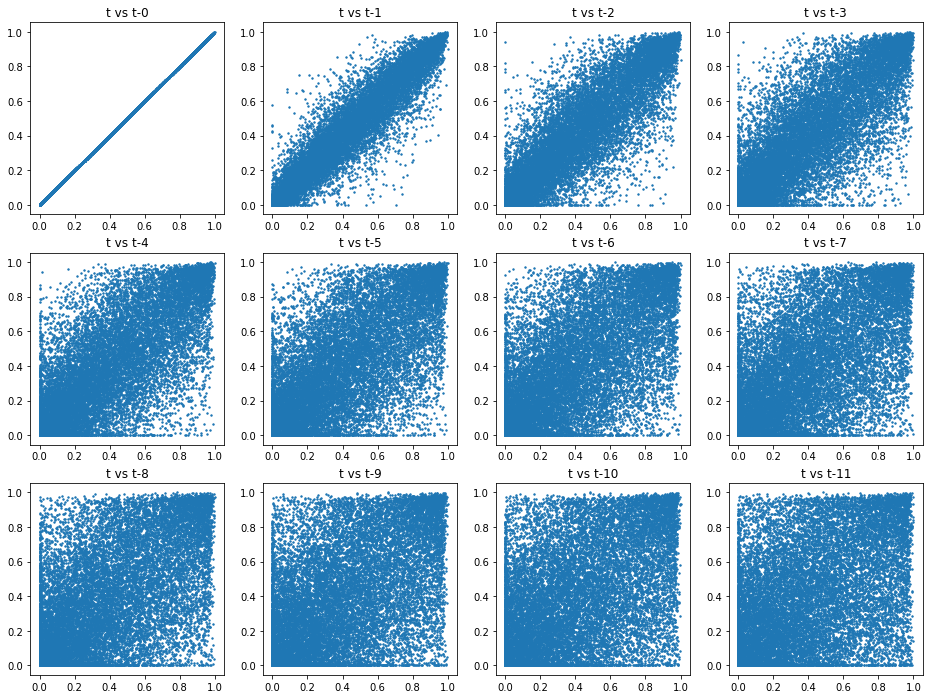

wf4


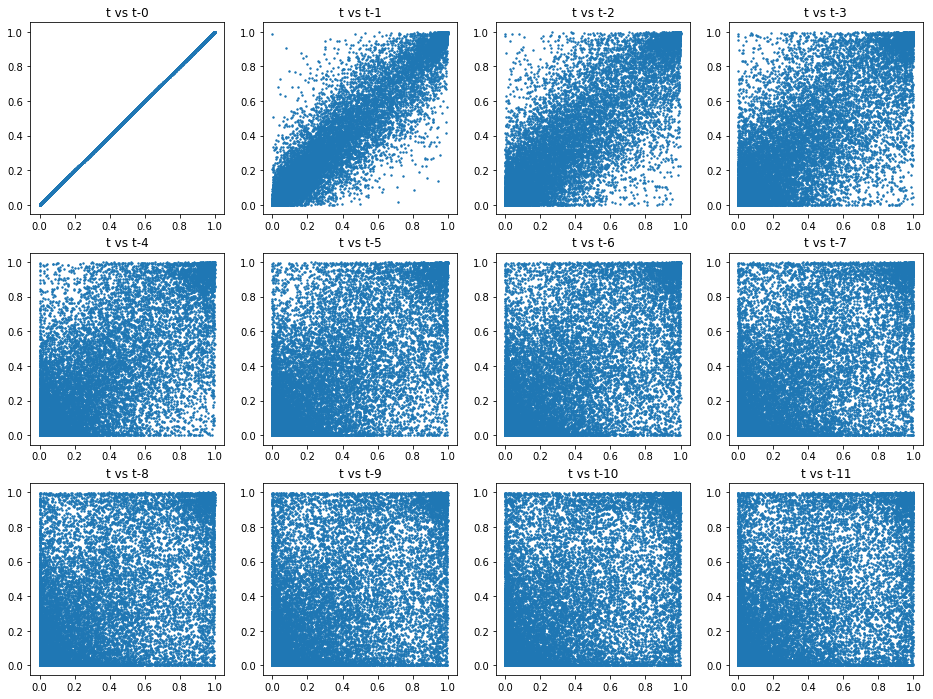

wf5


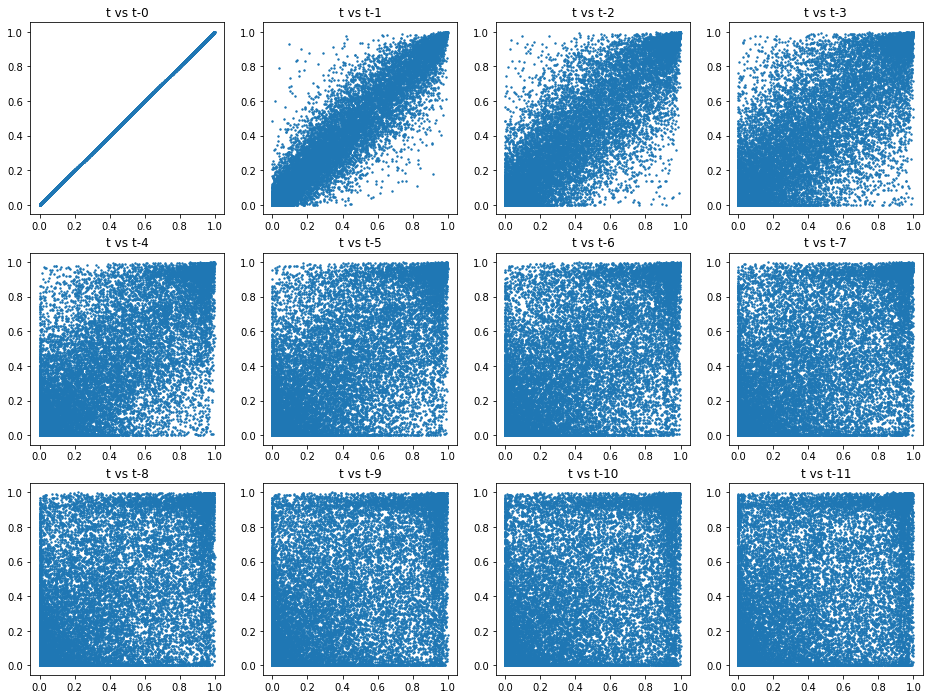

wf6


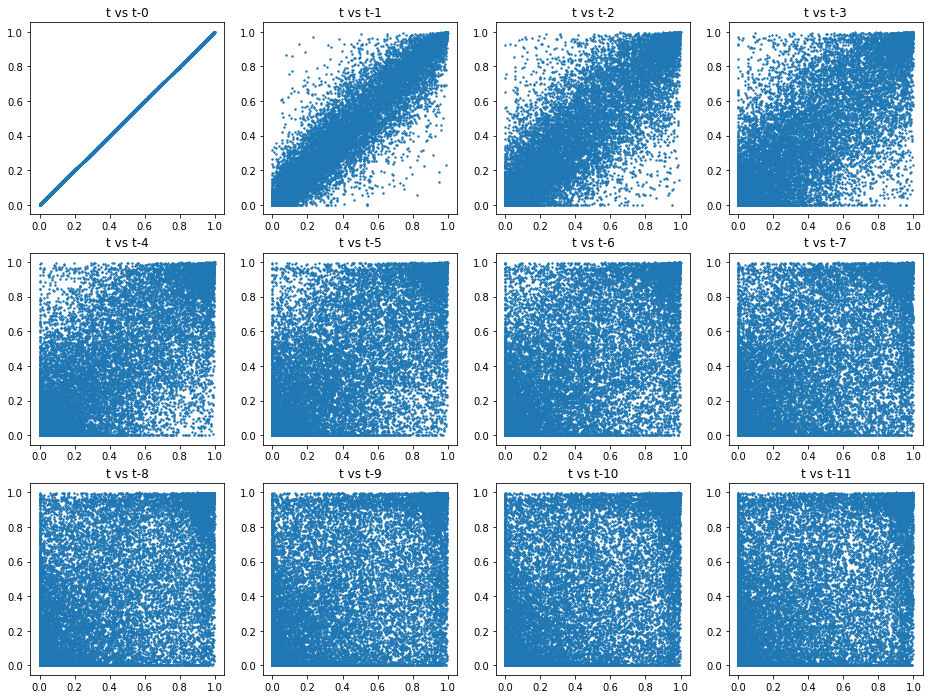

wf7


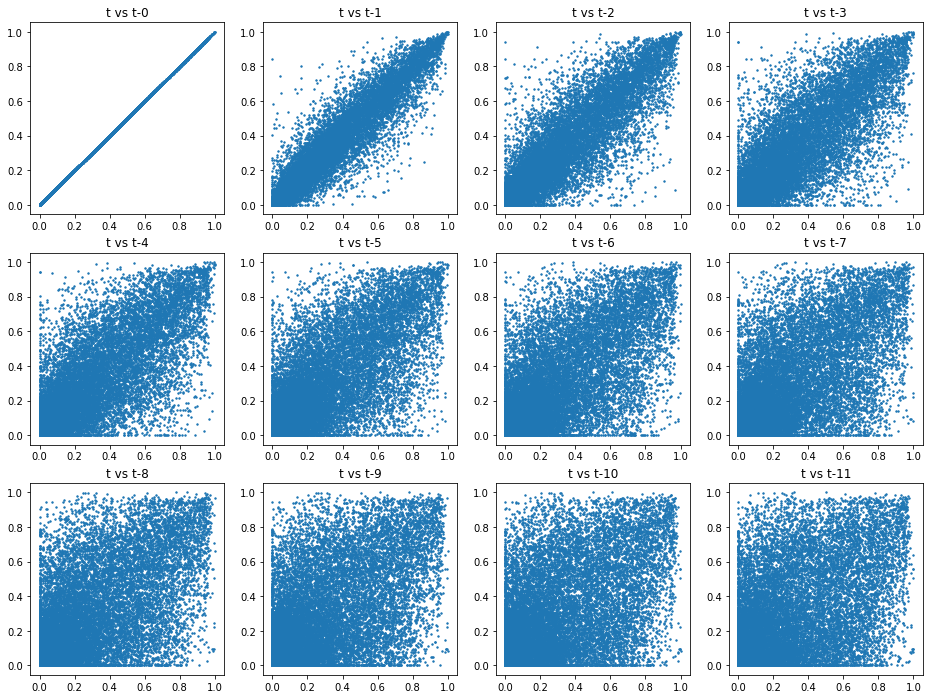

wf8


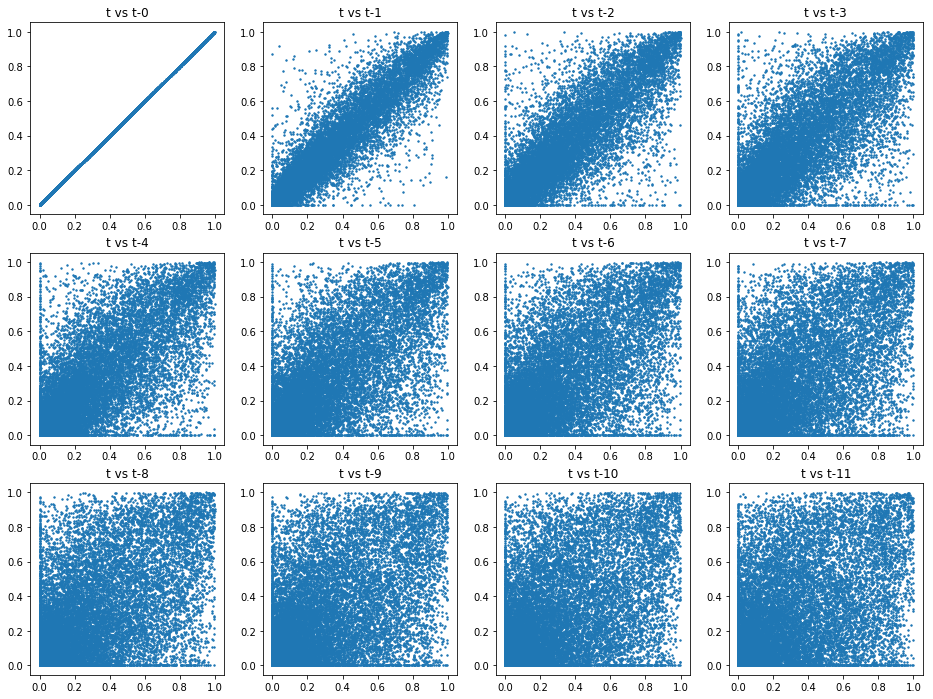

wf9


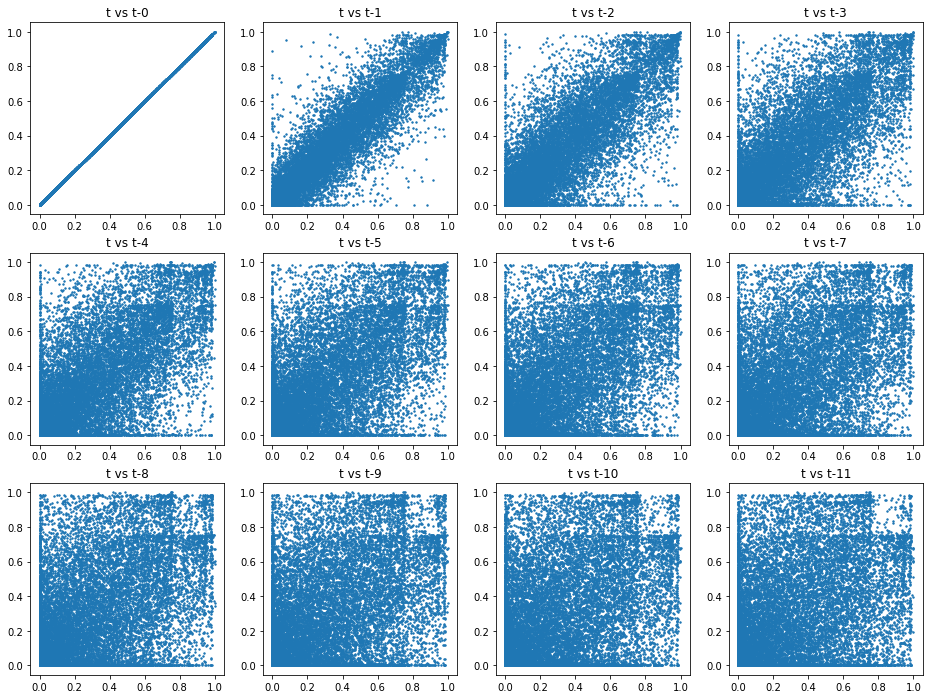

wf10


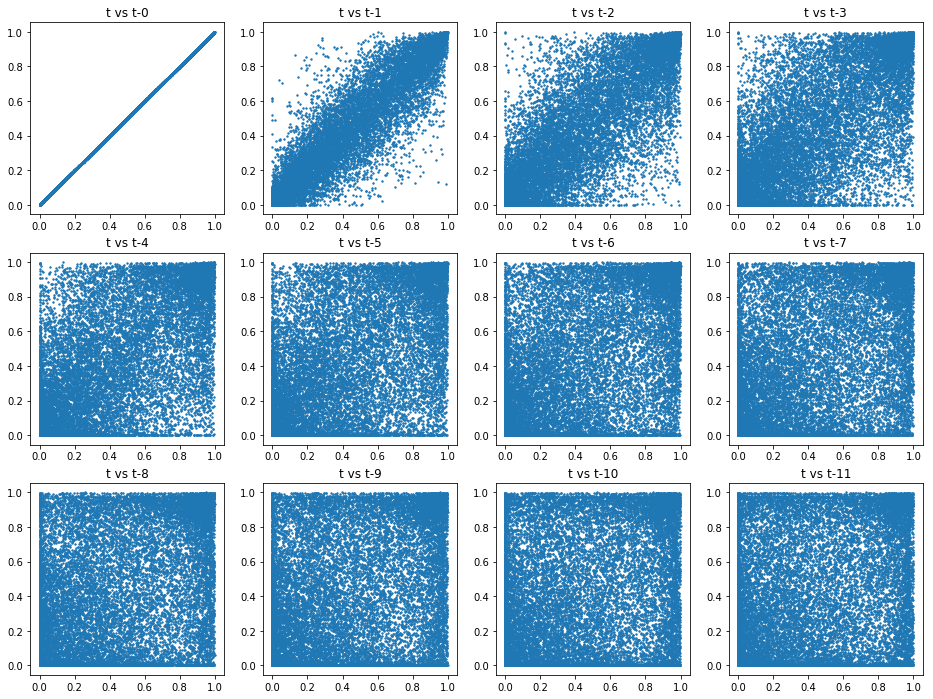

In [20]:
for column in df_power.columns:
    print(column)
    lag_scatter(df_power[column], 11)

##  Wind power autocorrelation

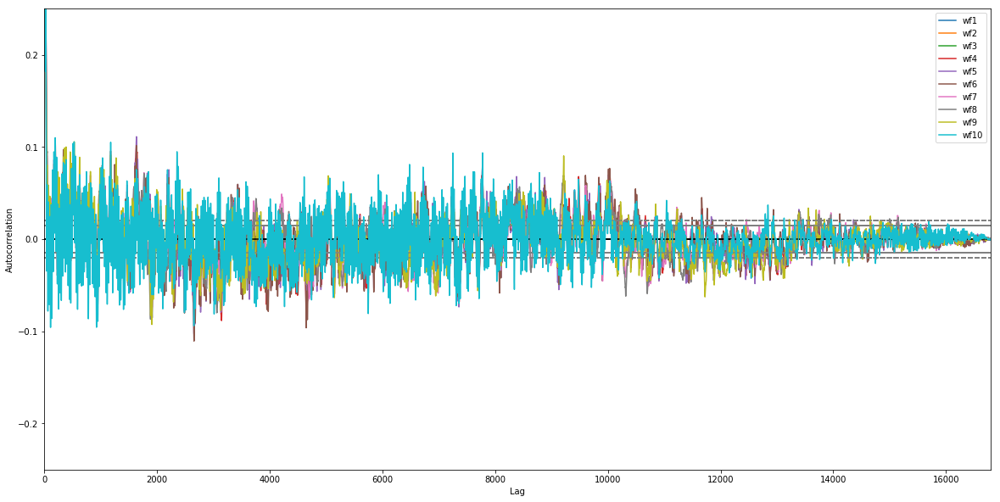

In [21]:
plt.figure(figsize=(20,10))
for column in df_power.columns:
    pd.plotting.autocorrelation_plot(df_power[column], label=column);
plt.ylim([-0.25,0.25])
plt.legend()

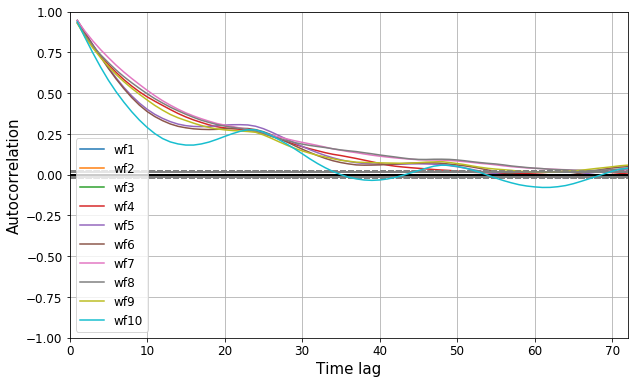

In [22]:
plt.figure(figsize=(10,6))
for column in df_power.columns:
    pd.plotting.autocorrelation_plot(df_power[column], label=column);
plt.xlim([0,72])
plt.xlabel('Time lag', fontsize=15)
plt.ylabel('Autocorrelation', fontsize=15)
plt.tick_params(labelsize=12)
plt.legend(fontsize=12)
plt.grid()

## Power spectral density

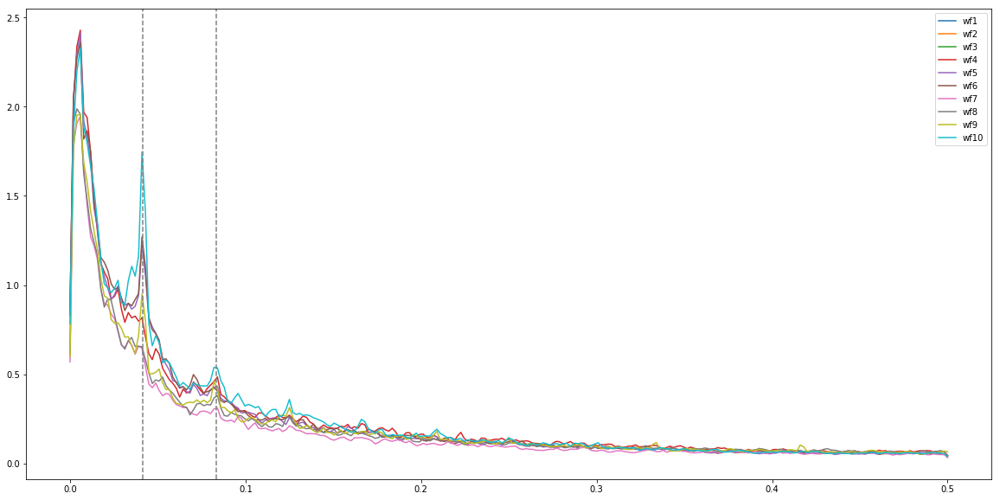

In [23]:
plt.figure(figsize=(20,10))
for column in df_power.columns:
    freqs, psd = sp.signal.welch(df_power[column].values, fs=1, window='hanning', nperseg=512, scaling='density')
    plt.plot(freqs, np.sqrt(psd), label=column)

plt.axvline(x=1/24, linestyle='--', color='grey')
plt.axvline(x=1/12, linestyle='--', color='grey')
plt.legend()

## Spectrogram

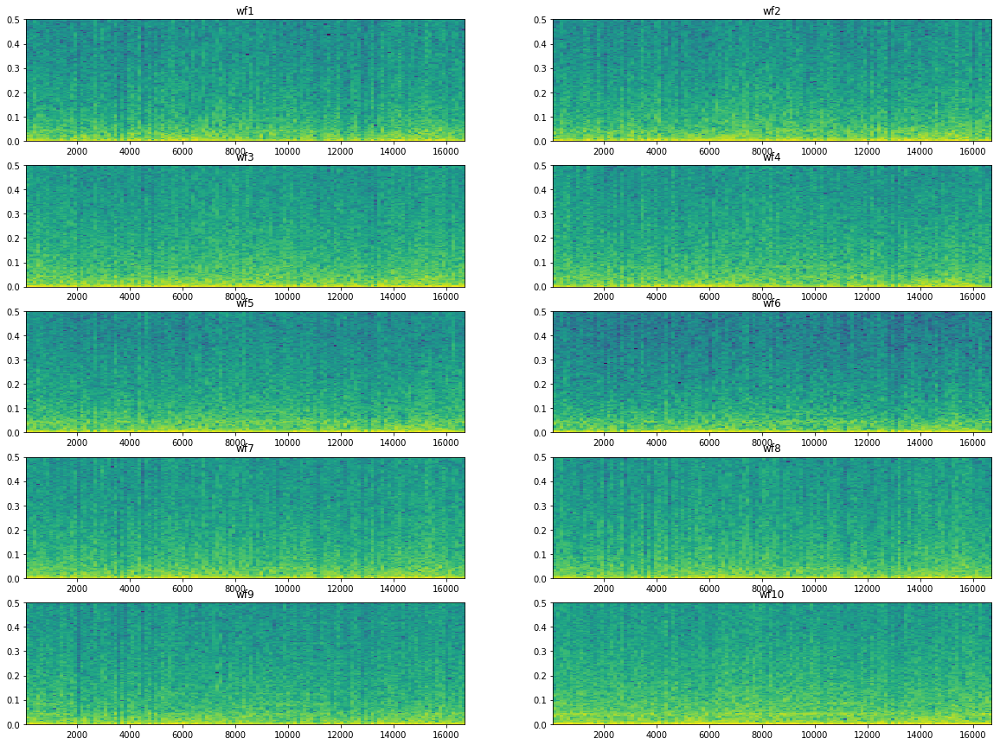

In [15]:
plt.figure(figsize=(20,15))
for i, column in enumerate(df_power.columns): 
    ax = plt.subplot(5,2,i+1)
    plt.title(column)
    ax.specgram(df_power[column].values, Fs=1);

## Wind power distribution

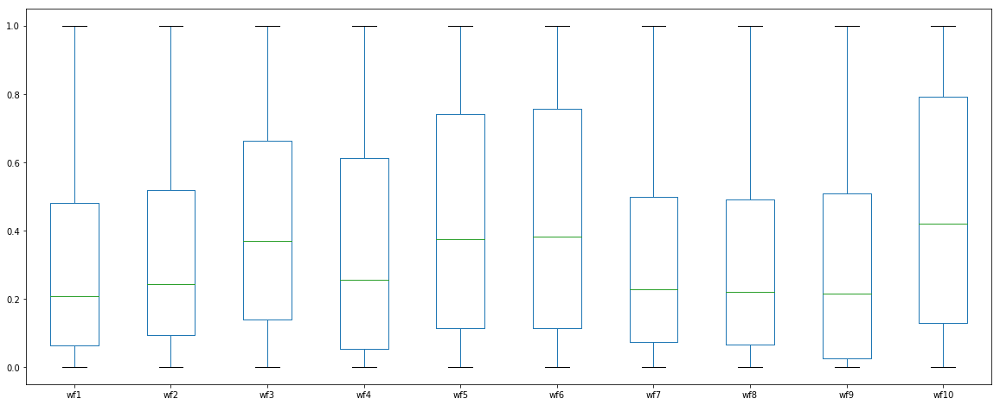

In [70]:
df_power.plot.box(figsize=(20,8))

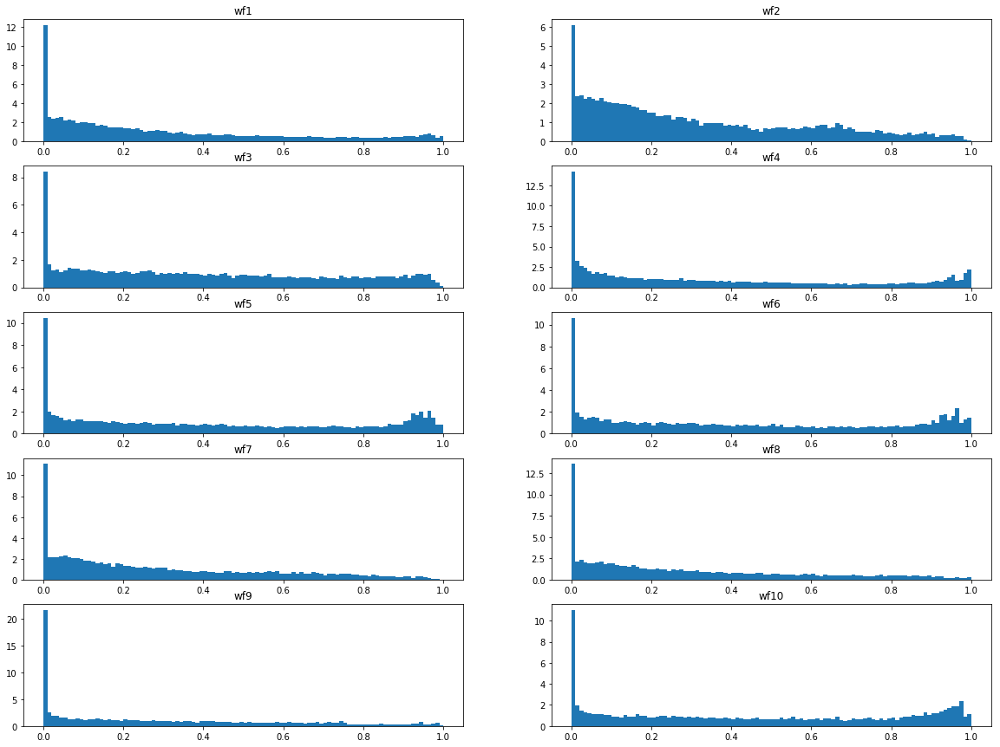

In [16]:
plt.figure(figsize=(20,15))
for i, column in enumerate(df_power.columns):
    ax = plt.subplot(5,2,i+1)
    plt.title(column)
    ax.hist(df_power[column].values, bins=100, density=True)

In [17]:
df_power[df_power == 0].count() / df_power.count()

wf1     0.091310
wf2     0.036071
wf3     0.057976
wf4     0.044643
wf5     0.077857
wf6     0.077976
wf7     0.081369
wf8     0.111071
wf9     0.152500
wf10    0.079940
dtype: float64

In [18]:
df_power[df_power == 1].count() / df_power.count()

wf1     0.000060
wf2     0.000060
wf3     0.000060
wf4     0.000179
wf5     0.000060
wf6     0.000060
wf7     0.000060
wf8     0.000060
wf9     0.000060
wf10    0.000060
dtype: float64

## Wind power scatter matrix

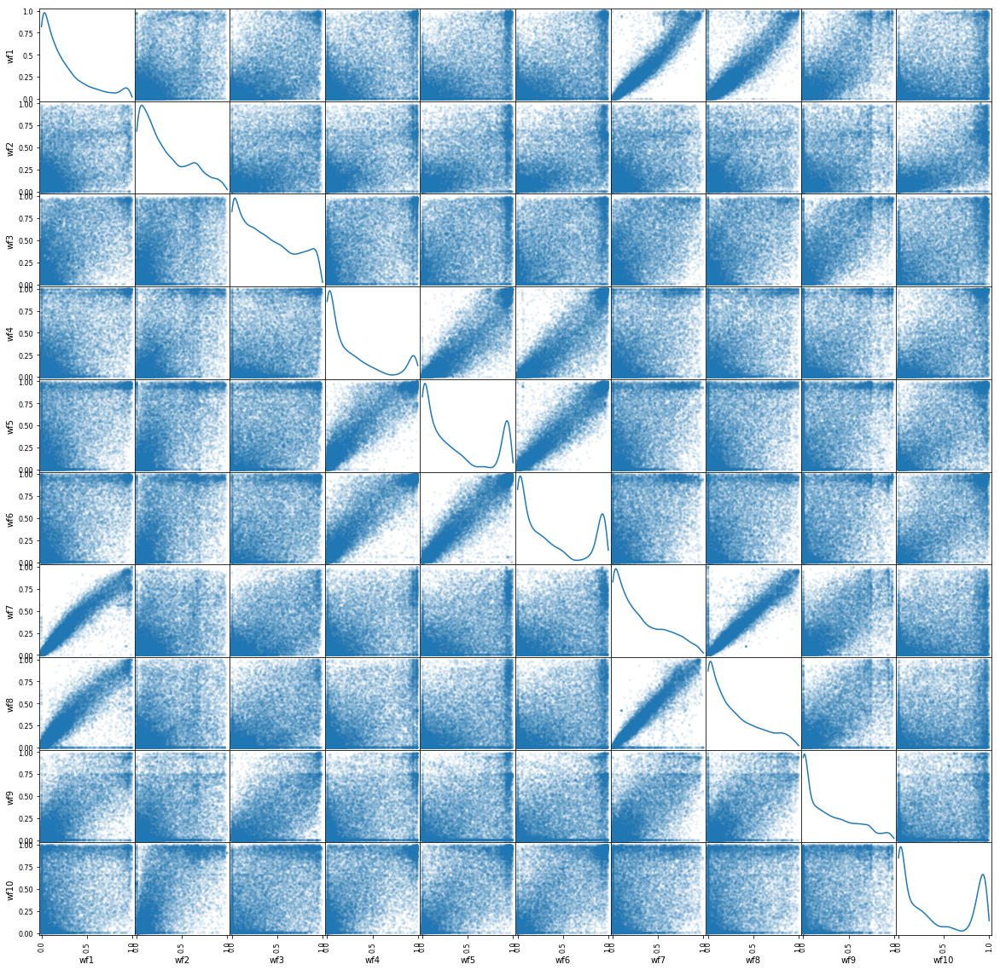

In [19]:
pd.plotting.scatter_matrix(df_power, alpha=0.1, figsize=(20, 20), diagonal='kde');

## Wind speed distribution

### U10

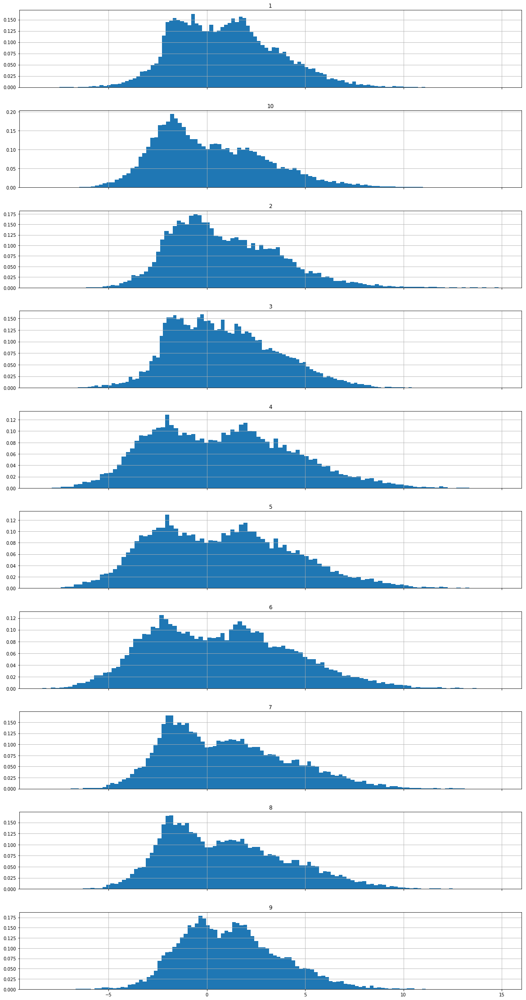

In [24]:
df_U10 = df_wind.loc[:, (slice(None), 'U10')]
df_U10.columns = df_U10.columns.droplevel(1)
df_U10.hist(bins=100, density=True, sharex=True, layout=(10,1), figsize=(20, 40));

### V10

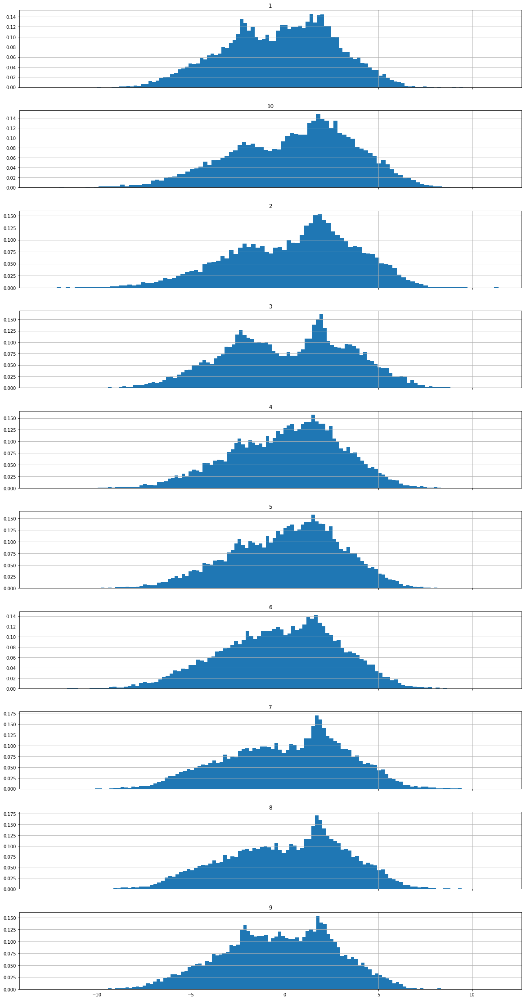

In [27]:
df_V10 = df_wind.loc[:, (slice(None), 'V10')]
df_V10.columns = df_V10.columns.droplevel(1)
df_V10.hist(bins=100, density=True, sharex=True, layout=(10,1), figsize=(20, 40));

### U100

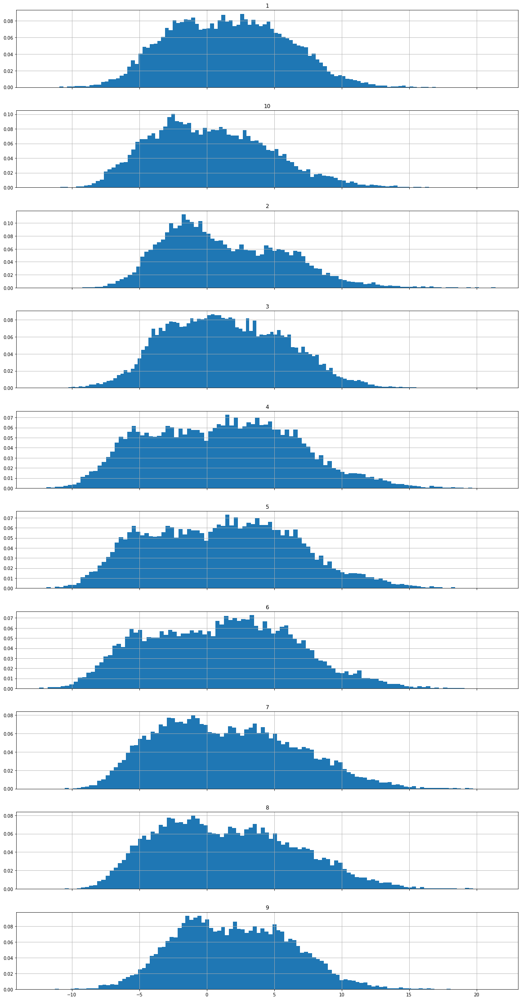

In [29]:
df_U100 = df_wind.loc[:, (slice(None), 'U100')]
df_U100.columns = df_U100.columns.droplevel(1)
df_U100.hist(bins=100, density=True, sharex=True, layout=(10,1), figsize=(20, 40));

### V100

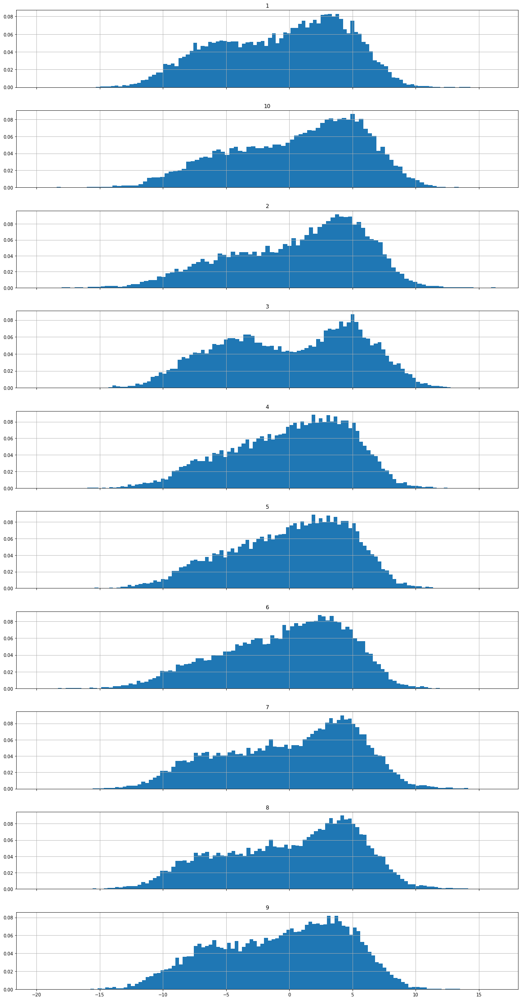

In [30]:
df_V100 = df_wind.loc[:, (slice(None), 'V100')]
df_V100.columns = df_V100.columns.droplevel(1)
df_V100.hist(bins=100, density=True, sharex=True, layout=(10,1), figsize=(20, 40));

## Power curve scatter

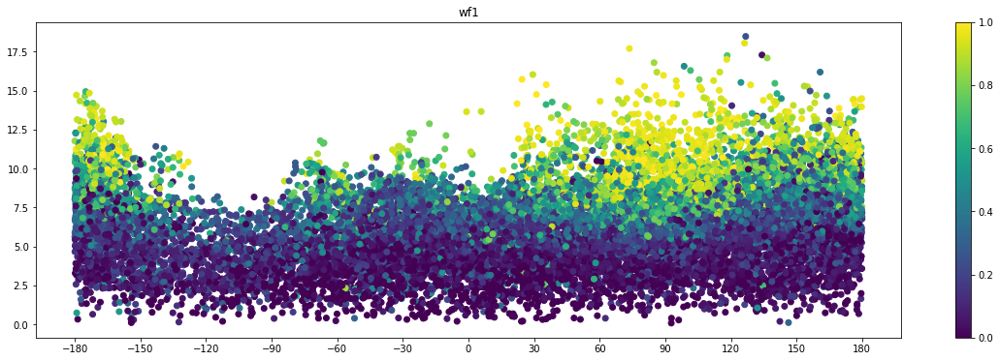

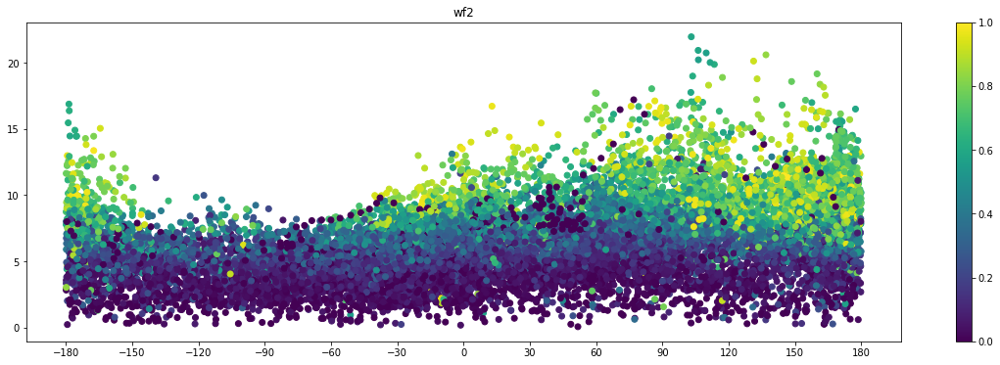

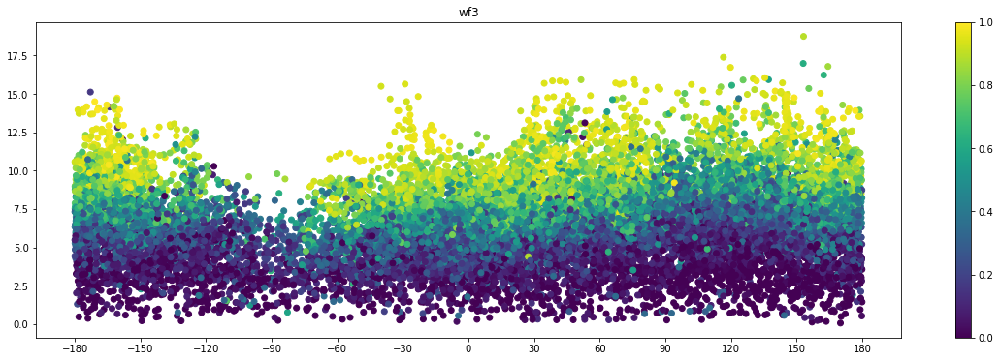

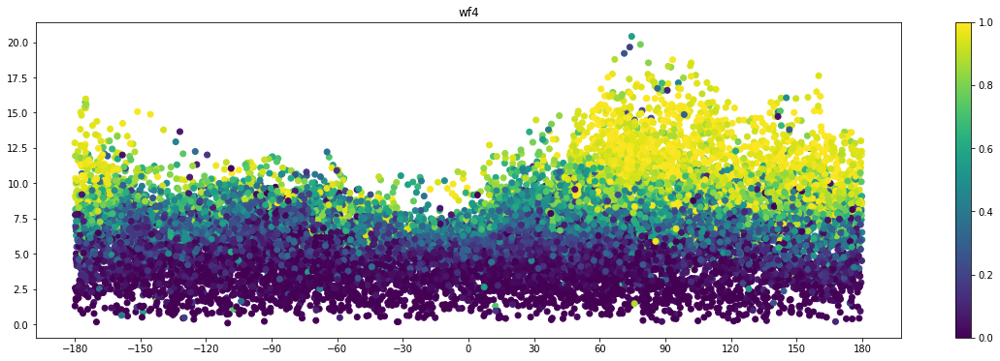

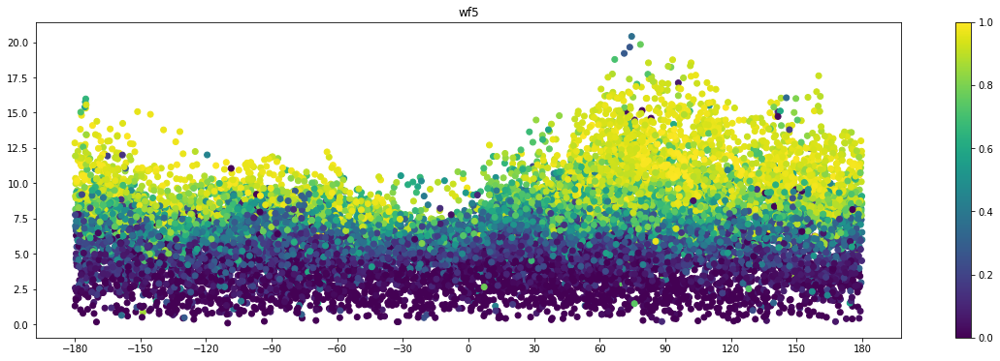

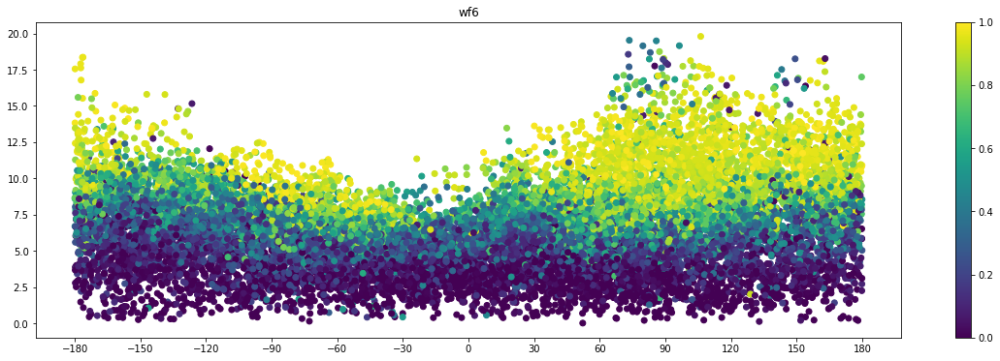

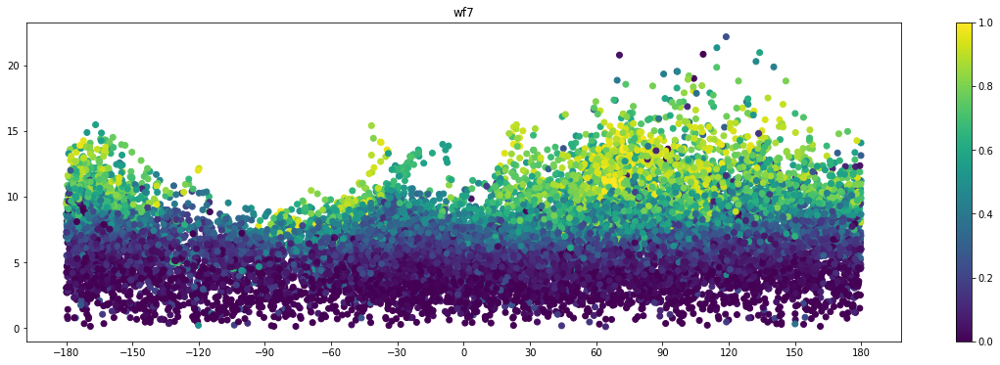

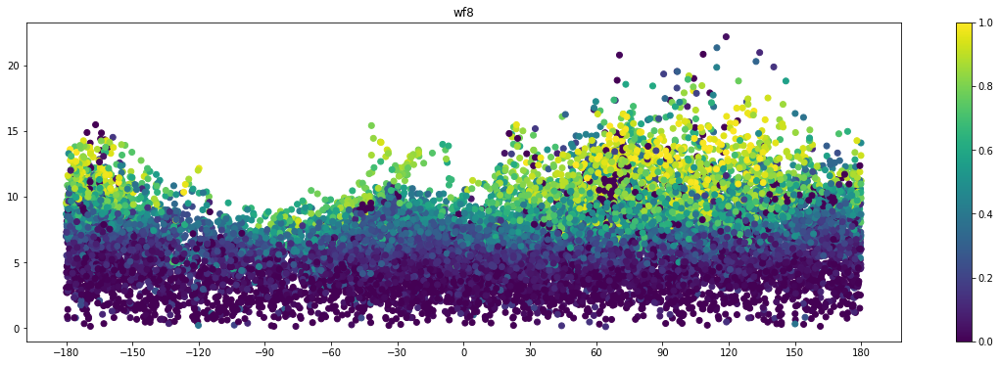

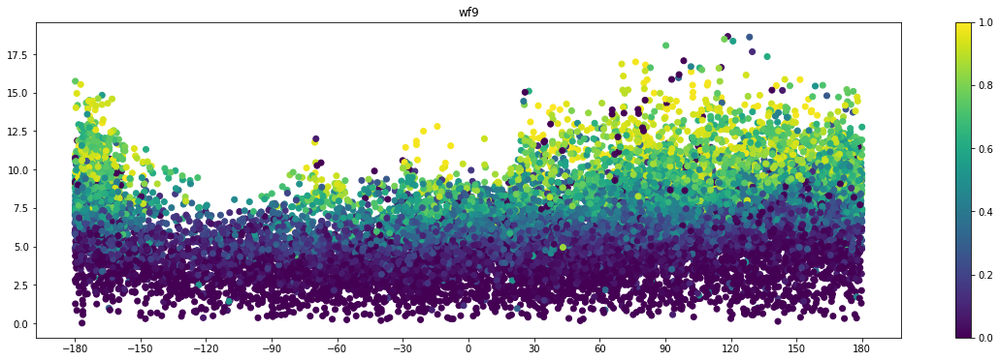

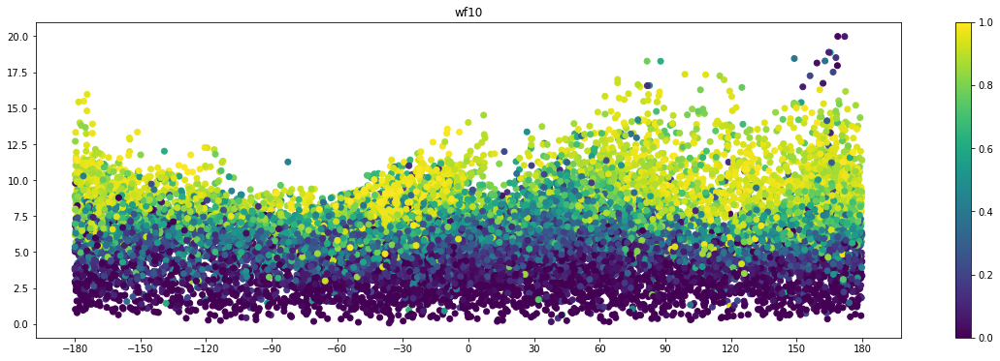

In [33]:
for i, column in enumerate(df_power.columns):
    df_U = np.sqrt(df_wind[str(i+1)]['U100']**2+df_wind[str(i+1)]['V100']**2)
    df_theta = (180/np.pi)*np.arctan2(df_wind[str(i+1)]['U100'], df_wind[str(i+1)]['V100'])
    fig = plt.figure(figsize=(20, 6))
    plt.title(column)
    col = plt.scatter(df_theta, df_U, c=df_power['wf'+str(i+1)].values, cmap='viridis')
    fig.colorbar(col)
    plt.xticks(range(-180,181,30))

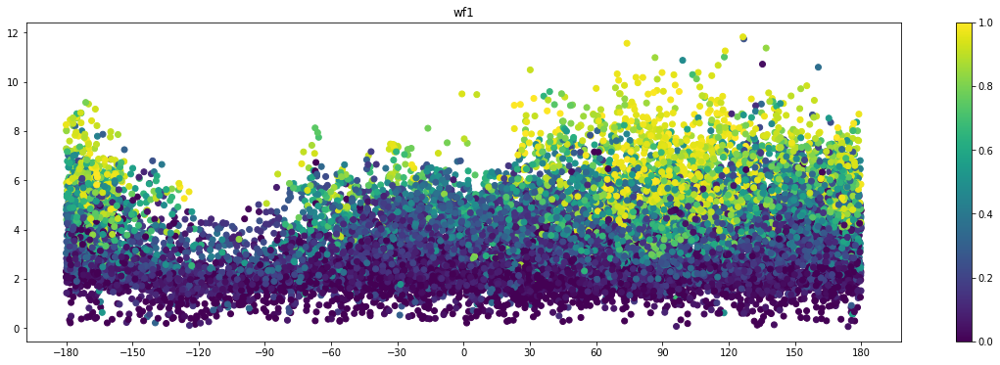

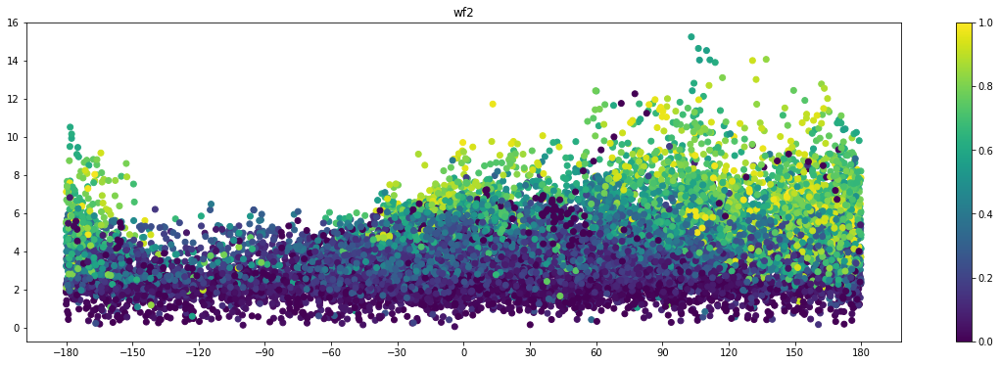

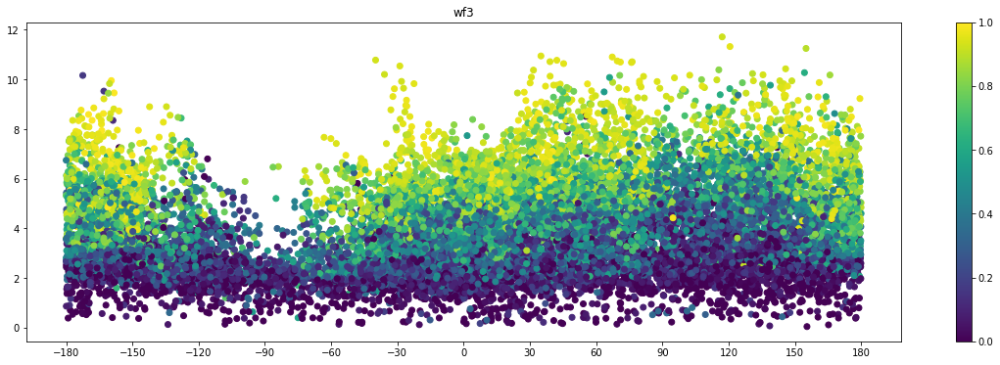

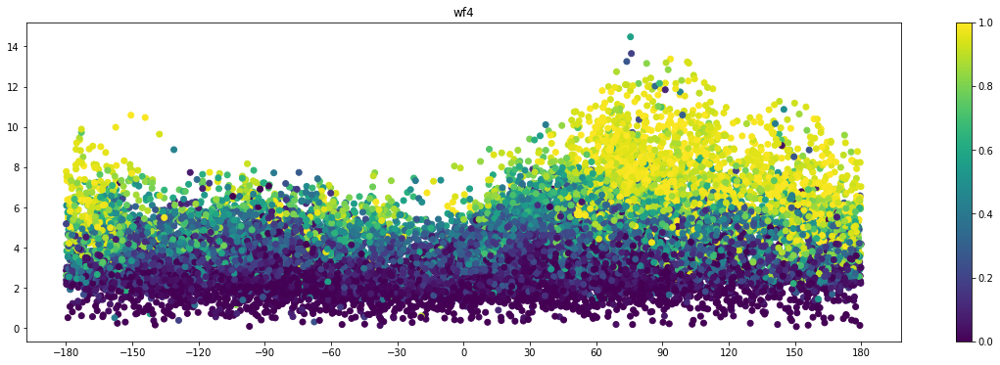

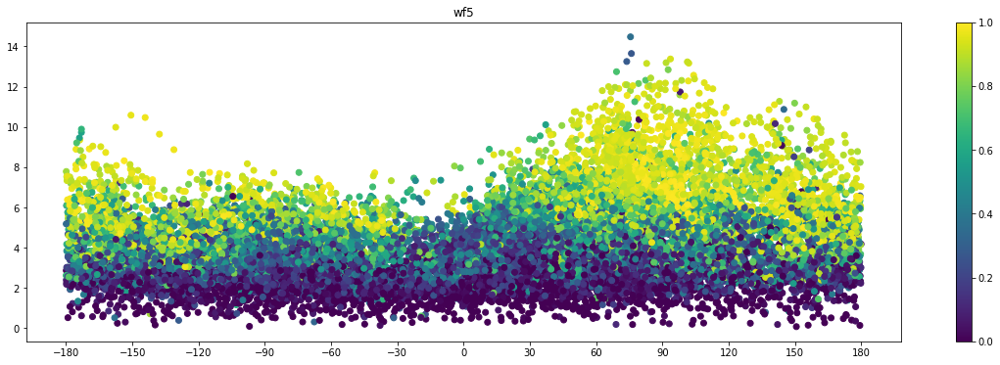

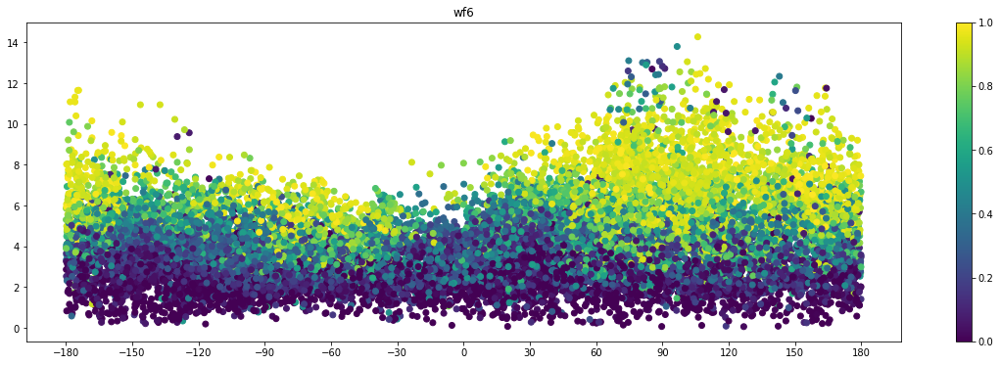

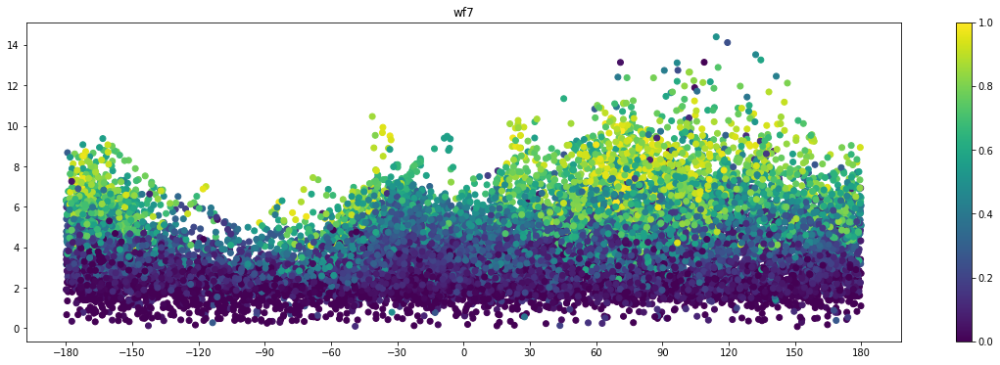

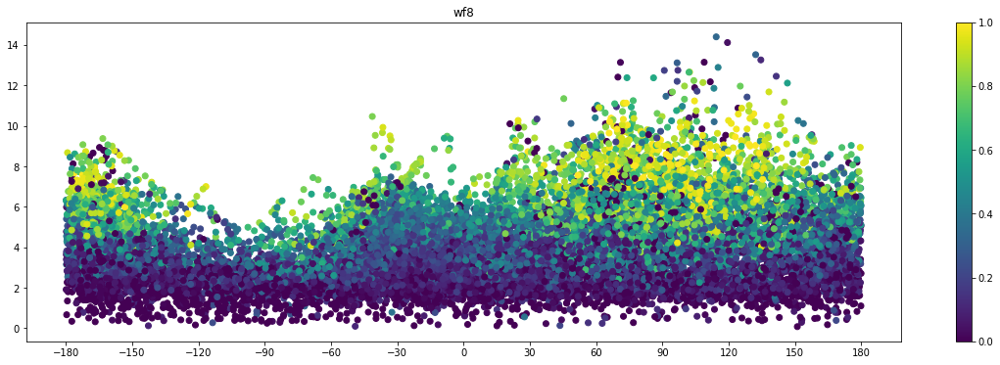

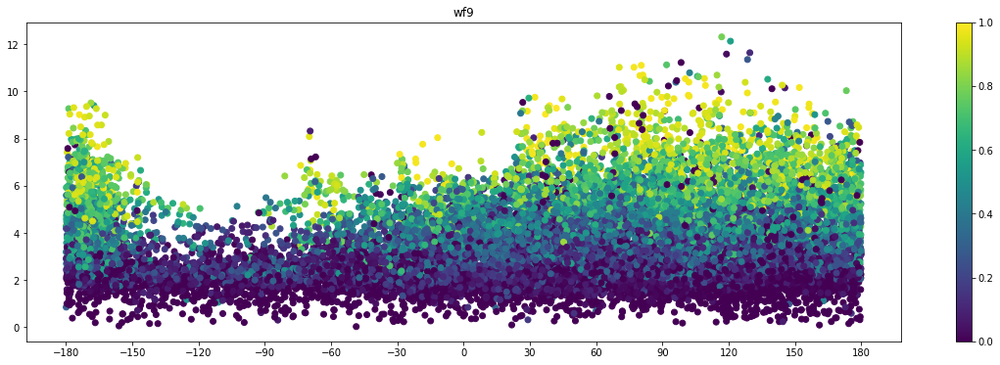

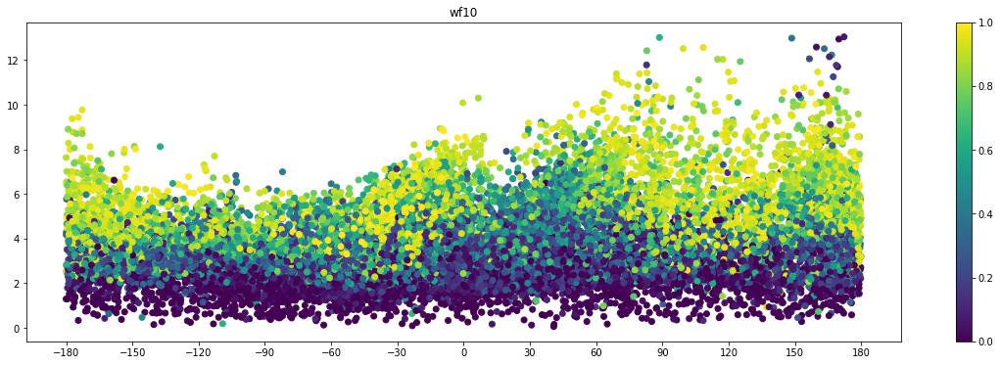

In [34]:
for i, column in enumerate(df_power.columns):
    df_U = np.sqrt(df_wind[str(i+1)]['U10']**2+df_wind[str(i+1)]['V10']**2)
    df_theta = (180/np.pi)*np.arctan2(df_wind[str(i+1)]['U10'], df_wind[str(i+1)]['V10'])
    fig = plt.figure(figsize=(20, 6))
    plt.title(column)
    col = plt.scatter(df_theta, df_U, c=df_power['wf'+str(i+1)].values, cmap='viridis')
    fig.colorbar(col)
    plt.xticks(range(-180,181,30))